# MODELO MLP 


In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from statsmodels.stats.diagnostic import acorr_ljungbox
import matplotlib.pyplot as plt
import statsmodels.api as sm
from math import sqrt
import plotly.express as px



## Datos

In [2]:
data = pd.read_csv(r"C:\Users\claud\Downloads\Bitcoin Historical Data.csv")
data

,Date,Price,Open,High,Low,Vol.,Change %
0,03/24/2024,"67,211.9","64,036.5","67,587.8","63,812.9",65.59K,4.96%
1,03/23/2024,"64,037.8","63,785.6","65,972.4","63,074.9",35.11K,0.40%
2,03/22/2024,"63,785.5","65,501.5","66,633.3","62,328.3",72.43K,-2.62%
3,03/21/2024,"65,503.8","67,860.0","68,161.7","64,616.1",75.26K,-3.46%
4,03/20/2024,"67,854.0","62,046.8","68,029.5","60,850.9",133.53K,9.35%
...,...,...,...,...,...,...,...
4994,07/22/2010,0.1,0.1,0.1,0.1,2.16K,0.00%
4995,07/21/2010,0.1,0.1,0.1,0.1,0.58K,0.00%
4996,07/20/2010,0.1,0.1,0.1,0.1,0.26K,0.00%
4997,07/19/2010,0.1,0.1,0.1,0.1,0.57K,0.00%


Para que los datos estén en el formato correcto se les aplicará el siguiente proceso de eliminación de formatos 

In [3]:
# Eliminar comas y convertir las columnas relevantes a float
data['Price'] = data['Price'].str.replace(',', '').astype(float)
data['Open'] = data['Open'].str.replace(',', '').astype(float)
data['High'] = data['High'].str.replace(',', '').astype(float)
# Función para convertir valores con 'K', 'M', 'B' o números directos
def convert_volume(value):
    # Verificar si el valor ya es numérico
    if isinstance(value, float) or isinstance(value, int):
        return value  # Devolver el valor si ya es numérico
    elif 'K' in value:
        return float(value.replace('K', '')) * 1_000
    elif 'M' in value:
        return float(value.replace('M', '')) * 1_000_000
    elif 'B' in value:
        return float(value.replace('B', '')) * 1_000_000_000
    else:
        return float(value.replace(',', ''))

# Aplicar la función a la columna 'Vol.'
data['Vol.'] = data['Vol.'].apply(convert_volume)

# Verificar que la conversión haya sido exitosa
print(data[['Vol.']].head())


       Vol.
0   65590.0
1   35110.0
2   72430.0
3   75260.0
4  133530.0


Se verifica el formato de la fecha y se agrega la columnna indice 

In [4]:
# Asegurarse de que la columna "Date" sea de tipo datetime
data['Date'] = pd.to_datetime(data['Date'], format='%m/%d/%Y')
# Ordenar los datos por fecha de forma ascendente
data = data.sort_values(by='Date', ascending=True).reset_index(drop=True)
# Verificar si hay valores nulos en cada columna
print(data.isnull().sum())
# Alternativa: Mostrar las filas que contengan valores faltantes
missing_data = data[data.isnull().any(axis=1)]
print(f"Filas con datos faltantes:\n{missing_data}")

# Asegúrate de que la columna 'Date' esté en formato datetime

# Convertir la fecha a un timestamp (número de días desde Epoch)

# Ver las primeras filas con la nueva columna numérica
data['indice'] = range(len(data))

Date        0
Price       0
Open        0
High        0
Low         0
Vol.        6
Change %    0
dtype: int64
Filas con datos faltantes:
          Date  Price  Open  High   Low  Vol. Change %
337 2011-06-20   17.5  17.5  17.5  17.5   NaN    0.00%
338 2011-06-21   17.5  17.5  17.5  17.5   NaN    0.00%
339 2011-06-22   17.5  17.5  17.5  17.5   NaN    0.00%
340 2011-06-23   17.5  17.5  17.5  17.5   NaN    0.00%
341 2011-06-24   17.5  17.5  17.5  17.5   NaN    0.00%
342 2011-06-25   17.5  17.5  17.5  17.5   NaN    0.00%


## Funciones 

### Ventanas deslizantes
Para esto creamos una función que divide los datos en entrenamiento, validación y prueba. Esta función avanca con un paso de 1. las ventanas y el horizonte de predicción son variables 

In [5]:
import numpy as np

def create_sliding_windows(data, window_size, horizon):
    X_train, Y_train = [], []
    X_val, Y_val = [], []
    X_test, Y_test = [], []

    # Generar ventanas deslizantes con sus índices correspondientes
    for i in range(0, len(data) - window_size - 3 * horizon + 1, 1):
        # Entrenamiento
        X_train.append(data[i:i + window_size])
        Y_train.append(data[i + window_size:i + window_size + horizon])

        # Validación
        X_val.append(data[i + window_size:i + window_size + horizon])
        Y_val.append(data[i + window_size + horizon:i + window_size + 2 * horizon])

        # Prueba
        X_test.append(data[i + window_size + horizon:i + window_size + 2 * horizon])
        Y_test.append(data[i + window_size + 2 * horizon:i + window_size + 3 * horizon])

    # Convertir a arrays de NumPy
    X_train = np.array(X_train)  # (n_samples, window_size)
    X_val = np.array(X_val)
    X_test = np.array(X_test)

    Y_train = np.array(Y_train)  # (n_samples, horizon)
    Y_val = np.array(Y_val)
    Y_test = np.array(Y_test)

    # Asegurarse de que los datos están en la forma adecuada para MLP (n_samples, n_features)
    X_train = X_train.reshape(X_train.shape[0], window_size)  # Eliminar dimensión extra
    X_val = X_val.reshape(X_val.shape[0], window_size)
    X_test = X_test.reshape(X_test.shape[0], window_size)

    return X_train, Y_train, X_val, Y_val, X_test, Y_test





### Construcción del Modelo
Creamos una función para crear el modelo teniendo en cuenta los parametros de las iteraciones neurons, window, dropout_rate, horizon. Batch size se aplicará más adelante 

In [6]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input

def build_mlp_model(neurons, window, dropout_rate, horizon):
    model = Sequential()
    model.add(Input(shape=(window,))) 
    model.add(Dense(neurons, activation='relu'))  
    model.add(Dropout(dropout_rate))  
    model.add(Dense(horizon))  
    model.compile(optimizer='adam', loss='mse')  
    return model



In [7]:
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import q_stat, acf
import statsmodels.api as sm
from scipy.stats import shapiro


### Métricas
Creamos una función que calcule las metricas importantes

In [8]:

def metricas(windows, pred, neurons, batchsize, dropout_rate, horizon, window):
    
    # Calcular métricas en Validación
    if np.isnan(pred).any():
        print("Advertencia: Las predicciones contienen NaN.")
        metrics=None
    else:
        
        mae = mean_absolute_error(windows, pred)
        mse = mean_squared_error(windows, pred)
        rmse = np.sqrt(mse)
        mape = np.mean(np.abs((windows - pred) / windows)) * 100
        r2 = r2_score(windows, pred)

        
        # Guardar métricas del conjunto de validación junto con pruebas de hipótesis
        metrics = {
            'neurons': neurons,
            'batchsize': batchsize,
            'Dropout': dropout_rate,
            'horizon': horizon,
            'window': window,
            'MAPE': mape,
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
        
    }
    return metrics


In [9]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot
from statsmodels.tsa.stattools import acf, q_stat
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import plotly.express as px
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler


### Función de optimización
se creo una función con la cual se itera entre todas las posibles combinaciones de paramtros. Se tiene en cuenta el early stoping y la estabilización de la metrica mse para encontar el mejor modelo. luego de que el mse no varie más del 5% 5 iteraciones seguidas se detiene. Además se guardan los residuos y metricas de cada modelo para su posterior uso.

In [10]:
def busqueda(datos, windows, horizons, dropout_rates, batchsizes, neurons_list):
    validation_metrics = []
    test_metrics = []
    train_metrics = []
    residual_hist = []

    best_model = None
    params_best_model = {}
    best_score = np.inf 
    previous_mse = None  # Para rastrear el MSE de la iteración anterior
    residuals_bestmodel = None
    stable_iterations = 0  # Contador para rastrear iteraciones estables

    early_stop = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    )

    for neurons in neurons_list:
        for window in windows:
            for horizon in horizons:
                if window == horizon:
                    x_train, y_train, x_val, y_val, x_test, y_test = create_sliding_windows(
                        datos, window, horizon)
                    for dropout_rate in dropout_rates:
                        for batchsize in batchsizes:

                            # Crear y entrenar el modelo
                            print(f"Entrenando modelo con {neurons} neuronas, dropout {dropout_rate}, "
                                  f"batch size {batchsize}, horizon {horizon}, window {window}")
                            model = build_mlp_model(neurons, window, dropout_rate, horizon)

                            early_stop = EarlyStopping(
                                monitor='val_loss', patience=2, 
                                restore_best_weights=True, verbose=1)

                            history = model.fit(
                                x_train, y_train,
                                validation_data=(x_val, y_val),
                                callbacks=[early_stop],
                                epochs=1, batch_size=batchsize, verbose=0
                            )

                            # Predicciones y cálculo de residuos
                            val_pred = model.predict(x_val)
                            test_pred = model.predict(x_test)
                            train_pred = model.predict(x_train)

                            residuals = y_val - val_pred  # Residuos de validación
                            residual_hist.append({
                                'neurons': neurons,
                                'batchsize': batchsize,
                                'dropout_rate': dropout_rate,
                                'horizon': horizon,
                                'window': window,
                                'residuals': residuals
                            })

                            # Calcular métricas en validación
                            
                            metricas_val = metricas(y_val, val_pred, neurons, batchsize, dropout_rate, horizon, window)
                            validation_metrics.append(metricas_val)

                            # Calcular métricas en prueba
                            metricas_test = metricas(y_test, test_pred, neurons, batchsize, dropout_rate, horizon, window)
                            test_metrics.append(metricas_test)

                            # Calcular métricas en entrenamiento
                            metricas_train = metricas(y_train, train_pred, neurons, batchsize, dropout_rate, horizon, window)
                            train_metrics.append(metricas_train)

                            if metricas_val:
                                mse = metricas_val['MSE']
                                print(f"MSE: {mse}")

                                # Verificar la fluctuación del MSE
                                if previous_mse:
                                    variation = abs(mse - previous_mse) / previous_mse
                                    if variation < 0.05:
                                        stable_iterations += 1
                                        print(f"Fluctuación menor al 5% en el MSE por {stable_iterations} iteración(es).")
                                    else:
                                        stable_iterations = 0  # Reiniciar contador si hay variación mayor al 5%

                                    if stable_iterations >= 5:
                                        print("Fluctuación menor al 5% durante 5 iteraciones consecutivas. Deteniendo la búsqueda.")
                                        return (validation_metrics, test_metrics, train_metrics, 
                                                residual_hist, best_model, params_best_model, residuals_bestmodel)

                                previous_mse = mse

                                # Guardar el mejor modelo si es necesario
                                if mse < best_score:
                                    best_score = mse
                                    best_model = model
                                    params_best_model = {
                                        'neurons': neurons,
                                        'batchsize': batchsize,
                                        'dropout_rate': dropout_rate,
                                        'horizon': horizon,
                                        'window': window,
                                        'MSE': mse
                                    }
                                    residuals_bestmodel = residuals

    return (validation_metrics, test_metrics, train_metrics, residual_hist, best_model, params_best_model, residuals_bestmodel)


## Serie Price
Utilización de las funciones para encontrar los mejores parametros para la serie de tiempo `Price`


### Modelo

In [11]:
windows=[7,14,21,28]
horizons=[7,14,21,28]
dropout_rates=[0.2,0.4,0.6,0.8]
batchsizes=[16,32,64,128]
neurons_list=[10, 100, 1000,10000]


datos=data['Price']
validation_metrics_price,test_metrics_price,train_metrics_price,residual_hist_price,best_model_price,params_best_model_price,residuals_bestmodel_price=busqueda (datos,windows,horizons,dropout_rates,batchsizes,neurons_list)

Entrenando modelo con 10 neuronas, dropout 0.2, batch size 16, horizon 7, window 7
156/156 [==============================] - 0s 711us/step
MSE: 29769596.09965461
Entrenando modelo con 10 neuronas, dropout 0.2, batch size 32, horizon 7, window 7
156/156 [==============================] - 0s 708us/step
MSE: 237090755.9195588
Entrenando modelo con 10 neuronas, dropout 0.2, batch size 64, horizon 7, window 7
156/156 [==============================] - 0s 631us/step
MSE: 437918731.98866457
Entrenando modelo con 10 neuronas, dropout 0.2, batch size 128, horizon 7, window 7
156/156 [==============================] - 0s 612us/step
MSE: 211145347.08928603
Entrenando modelo con 10 neuronas, dropout 0.4, batch size 16, horizon 7, window 7
156/156 [==============================] - 0s 605us/step
MSE: 32448104.528002378
Entrenando modelo con 10 neuronas, dropout 0.4, batch size 32, horizon 7, window 7
156/156 [==============================] - 0s 824us/step
MSE: 242957962.24745846
Entrenando modelo

In [12]:
print(params_best_model_price)


{'neurons': 1000, 'batchsize': 32, 'dropout_rate': 0.2, 'horizon': 7, 'window': 7, 'MSE': 2642186.204002728}


A diferencia de las RNN redes neuronales recurrentes el modelo mpl es rápido por que permite hacer la optimización con todos los posibles parametros. los mejores resultados fueron con la combinación {'neurons': 10000, 'batchsize': 32, 'dropout_rate': 0.4, 'horizon': 7, 'window': 7, 'MSE': 2633246.2263151007} 

In [13]:
import pandas as pd
import numpy as np
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.gofplots import qqplot
from statsmodels.tsa.stattools import acf
import matplotlib.pyplot as plt
import seaborn as sns


### Residuales
tomamos los residuos del mejor modelo para su evaluación y analisamos los residuales de cada ventana, además se mostraran las graficas para 5 ventanas aleatorias

In [14]:
res=residuals_bestmodel_price

   Ventana  LJung-Box (p-value)
0        1             0.172435
1        2             0.172435
2        3             0.172435
3        4             0.172435
4        5             0.172435
5        6             0.172435
6        7             0.172435
7        8             0.172435
8        9             0.172435
9       10             0.172435


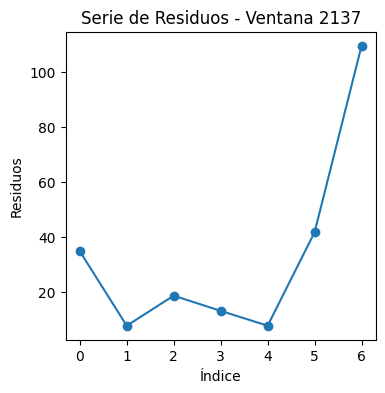

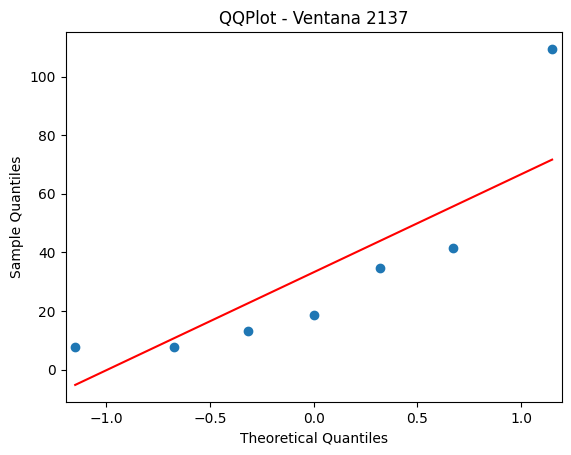

C:\Users\claud\AppData\Local\Temp\ipykernel_15068\1560686776.py:34: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.
  plt.stem(range(len(acf_vals)), acf_vals, use_line_collection=True)


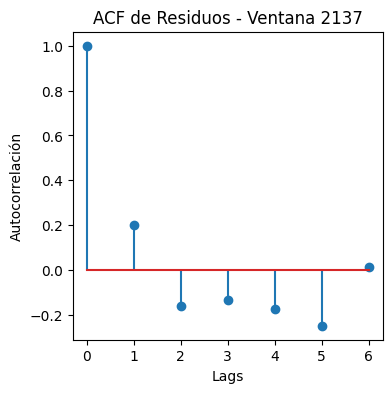

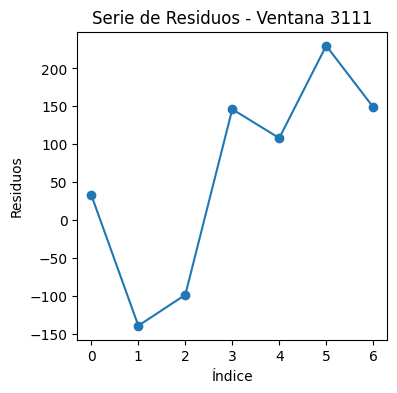

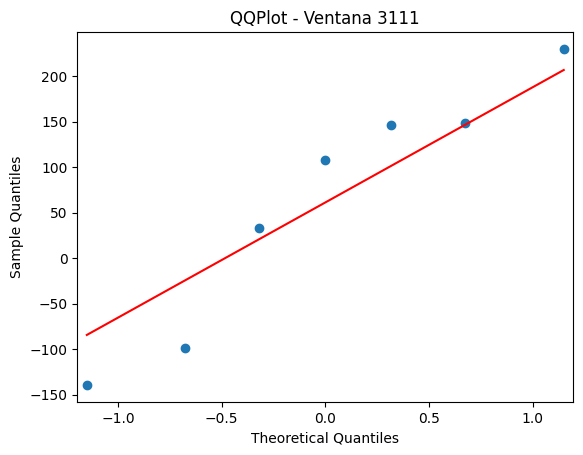

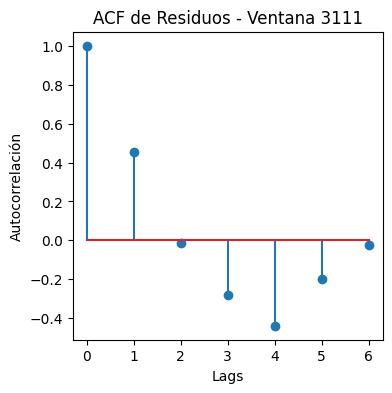

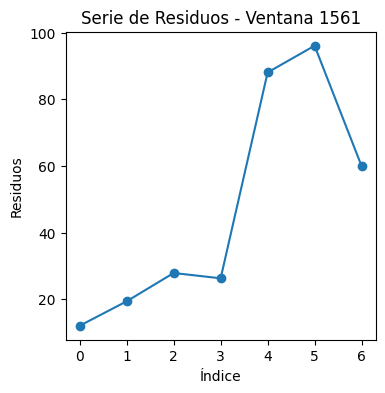

...

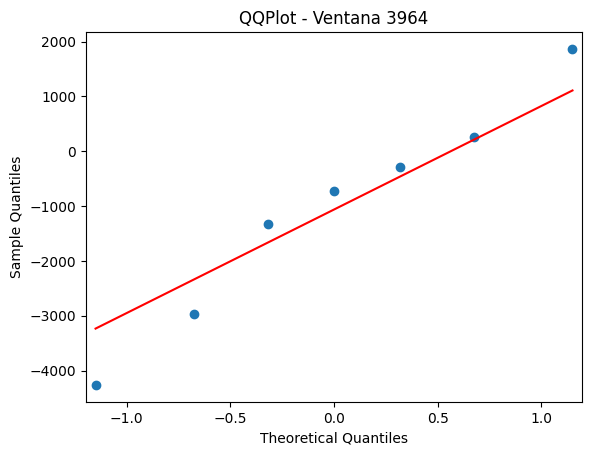

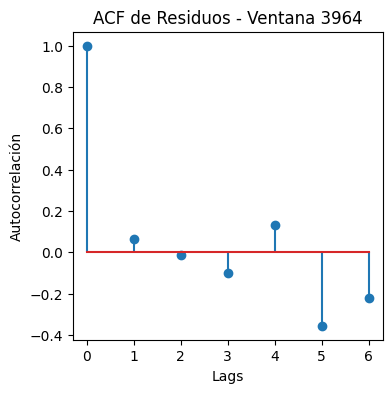

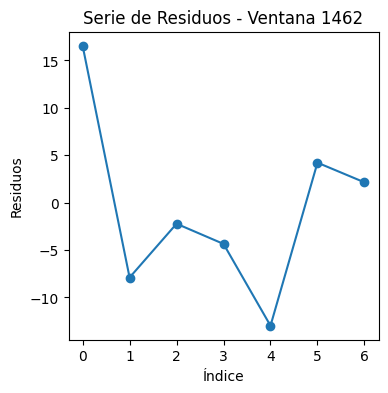

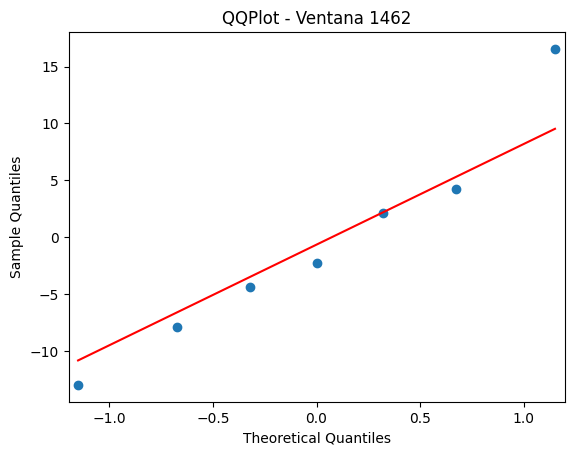

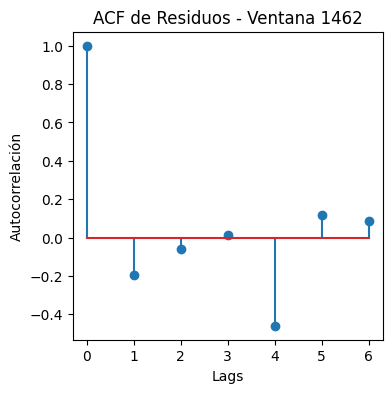

In [15]:


ljung_box_pvalues = []

for i, ventana in enumerate(res):
    ventana = np.array(ventana)
    ljung_box_pvalue = acorr_ljungbox(ventana, lags=[6], return_df=True)['lb_pvalue'].values[0]
    ljung_box_pvalues.append(ljung_box_pvalue)
df_resultados = pd.DataFrame({
    'Ventana': range(1, len(res) + 1),
    'LJung-Box (p-value)': ljung_box_pvalues
})

print(df_resultados.head(10))
# Seleccionar una muestra aleatoria de 5 ventanas para graficar
muestras = np.random.choice(len(res), size=5, replace=False)

for idx in muestras:
    ventana = np.array(res[idx])
    
    plt.figure(figsize=(4, 4))
    plt.plot(ventana, marker='o')
    plt.title(f'Serie de Residuos - Ventana {idx + 1}')
    plt.xlabel('Índice')
    plt.ylabel('Residuos')
    plt.show()

    
    qqplot(ventana, line='s')
    plt.title(f'QQPlot - Ventana {idx + 1}')
    plt.show()

    
    acf_vals = acf(ventana, nlags=min(10, len(ventana) - 1))
    plt.figure(figsize=(4, 4))
    plt.stem(range(len(acf_vals)), acf_vals, use_line_collection=True)
    plt.title(f'ACF de Residuos - Ventana {idx + 1}')
    plt.xlabel('Lags')
    plt.ylabel('Autocorrelación')
    plt.show()




De los residuales podemos secir que no cumplen cumplen, no distribuyen normal, tienen asimetria, además no son independientes.

In [16]:
metrics_list = validation_metrics_price  # Lista que contiene los diccionarios
metricas = []

for i in metrics_list:
        
        metricas.append(i)

#### Tabla de todos los modelos, sus parametros y sus metricas

In [17]:
metricasval=pd.DataFrame(metricas)
metricasval = metricasval.drop_duplicates()
metricasval

,neurons,batchsize,Dropout,horizon,window,MAPE,MAE,MSE,RMSE,R2
0,10,16,0.2,7,7,26.677145,2447.209815,2.976960e+07,5456.152133,0.879194
1,10,32,0.2,7,7,65.144377,7043.162041,2.370908e+08,15397.751651,0.036452
2,10,64,0.2,7,7,94.279439,10289.630920,4.379187e+08,20926.507878,-0.776610
3,10,128,0.2,7,7,63.607295,6893.158399,2.111453e+08,14530.841238,0.146865
4,10,16,0.4,7,7,32.619640,3057.335311,3.244810e+07,5696.323773,0.868695
...,...,...,...,...,...,...,...,...,...,...
251,10000,128,0.6,28,28,17.584368,1470.991982,1.053639e+07,3245.980290,0.955280
252,10000,16,0.8,28,28,21.868592,2018.129223,1.754791e+07,4189.022867,0.925462
253,10000,32,0.8,28,28,17.072868,1383.329541,9.628390e+06,3102.964729,0.959156
254,10000,64,0.8,28,28,16.478765,1335.401147,9.136731e+06,3022.702630,0.961250


In [18]:
fig = px.line(metricasval, y='MSE', title='MSE vs Índice', labels={'index': 'Índice', 'MSE': 'MSE'})
fig.show()

En esta figura podemos observar el MSE a lo largo de las iteraciones, vemos que a medida que se aumnetaron las neuronas el resultado mejoraba. Además delemitar la busqueda a partir de los parametros que ya se sabía que tenian buen desempeño permitió estabilizar la metrica.

#### Boxplot

Ahora compararemos los errores en el entrenamiento, prueba y test con la metrica mape porque esta representa los errores de manera porcentual

In [19]:
metrics_list = train_metrics_price  
metricas_train = []

for i in metrics_list:
        
    metricas_train.append(i)
metricas_train=pd.DataFrame(metricas_train)
metricas_train = metricas_train.drop_duplicates()

In [20]:

metrics_list = test_metrics_price

metricas_test = []

for i in metrics_list:
    
        
    metricas_test.append(i)
metricas_test=pd.DataFrame(metricas_test)
metricas_test = metricas_test.drop_duplicates()


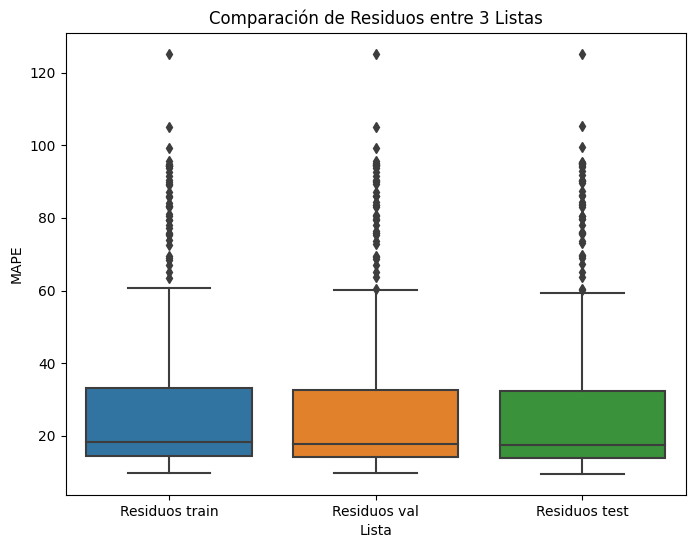

In [21]:
errores_train =  metricas_train['MAPE']
errores_val=   metricasval['MAPE']
errores_test =  metricas_test['MAPE']

# Crear una lista que contenga todas las listas de residuos
residuos = [errores_train, errores_val, errores_test]

# Crear el Boxplot usando Seaborn
plt.figure(figsize=(8, 6))
sns.boxplot(data=residuos)

# Personalizar el gráfico
plt.title('Comparación de Residuos entre 3 Listas')
plt.xlabel('Lista')
plt.ylabel('MAPE')
plt.xticks(ticks=[0, 1, 2], labels=['Residuos train', 'Residuos val', 'Residuos test'])

# Mostrar el gráfico
plt.show()

Las medianas son similares al igual que los las cajas porque al manejar la metodología de ventanas deslizantes los conjuntos son iguales a excepción de la primera y ultima ventana. sin embargo las medianas se van reduciendo porque el modelo aprende luego de evaluar el conjunto de validación, reajuste del modelo.

Los puntos por fuera de las cajas implican que el modelo suavizó picos o fluctuaciones atípicas 

### Prediciones

In [22]:
mejormodelo=best_model_price

X_train, Y_train, X_val, Y_val, X_test, Y_test=create_sliding_windows(datos, 7, 7)

train=mejormodelo.predict(X_train)
val=mejormodelo.predict(X_val)
test=mejormodelo.predict(X_test)

156/156 [==============================] - 0s 638us/step


Aquí podemos ver la predicción de las ventanas para entrenamiento de manera independiente

In [ ]:

train_data = []
for i, row in enumerate(train):
    for j, value in enumerate(row):
        train_data.append({
            "Conjunto": "Train", 
            "Índice": i + 1 + j, 
            "Valor": value
        })
        
val_data = []
for i, row in enumerate(val):
    for j, value in enumerate(row):
        train_data.append({
            "Conjunto": "val",  
            "Índice": i + 8+ j, 
            "Valor": value
        })
test_data = []
for i, row in enumerate(test):
    for j, value in enumerate(row):
        train_data.append({
            "Conjunto": "test",  
            "Índice": i + 16+ j, 
            "Valor": value
        })

# Preparar los datos para la lista 'datos'
datos_data = []
for i, value in enumerate(data['Price']):
    datos_data.append({
        "Conjunto": "Datos", 
        "Fila": "Serie Datos", 
        "Índice": i+1,  
        "Valor": value
    })

# Combinar ambos conjuntos de datos en un DataFrame
df_plot = pd.DataFrame(train_data + datos_data+val_data+test_data)

# Crear el gráfico con Plotly Express
fig = px.line(
    df_plot, 
    x="Índice", 
    y="Valor", 
    color="Conjunto",  # Diferenciar 'Train' y 'Datos'
      # Mantener la separación por filas
    markers=True, 
    title="Gráfico de Train y Lista Datos"
)

# Mostrar la figura
fig.show()


En la grafica se puede los horizones de predicción para cada ventana. el conjunto de train es igual al de validación sin embargo la prueba se mantiene con diferencia

## Serie Change%

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Crear el objeto escalador

datos=data['Change %']
datos = pd.Series(datos).str.replace('%', '', regex=False).astype(float) / 100

scaler = MinMaxScaler()
datos = np.array(datos).reshape(-1, 1)
# Escala los datos
datos = scaler.fit_transform(datos).flatten()+1



Para esta serie se hizo una modificación especial, no solo se esscalaron los datos sino que se les sumó 1 para evitar tener errores por valores en 0, a la hora de calcular las métricas 

In [ ]:
windows=[7,14,21,28]
horizons=[7,14,21,28]
dropout_rates=[0.2,0.4,0.6,0.8]
batchsizes=[16,32,64,128]
neurons_list=[10, 100, 1000,10000]

validation_metrics_ch,test_metrics_ch,train_metrics_ch,residual_hist_ch,best_model_ch,params_best_model_ch,residuals_bestmodel_ch=busqueda (datos,windows,horizons,dropout_rates,batchsizes,neurons_list)

Entrenando modelo con 10 neuronas, dropout 0.2, batch size 16, horizon 7, window 7
156/156 [==============================] - 0s 1ms/step
MSE: 0.05909333935263944
Entrenando modelo con 10 neuronas, dropout 0.2, batch size 32, horizon 7, window 7
156/156 [==============================] - 0s 1ms/step
MSE: 0.2603373231986953
Entrenando modelo con 10 neuronas, dropout 0.2, batch size 64, horizon 7, window 7
156/156 [==============================] - 0s 3ms/step
MSE: 1.585581443658808
Entrenando modelo con 10 neuronas, dropout 0.2, batch size 128, horizon 7, window 7
156/156 [==============================] - 0s 750us/step
MSE: 2.694763131293776
Entrenando modelo con 10 neuronas, dropout 0.4, batch size 16, horizon 7, window 7
156/156 [==============================] - 0s 1ms/step
MSE: 0.11707063148044801
Entrenando modelo con 10 neuronas, dropout 0.4, batch size 32, horizon 7, window 7
156/156 [==============================] - 0s 2ms/step
MSE: 0.18169854365926572
Entrenando modelo con 10

In [ ]:
print(params_best_model_ch)

{'neurons': 10000, 'batchsize': 64, 'dropout_rate': 0.2, 'horizon': 7, 'window': 7, 'MSE': 0.00036826683431922077}


Los mejores parametros para la serie `Change %` fueron: 
{'neurons': 10000, 'batchsize': 64, 'dropout_rate': 0.2, 'horizon': 7, 'window': 7, 'MSE': 0.00036826683431922077}. De las series analizadas podemos decir que 10000 neuronas y ventanas de 7 valores entregan mejores resultados

### Residuales
tomamos los residuos del mejor modelo  para la serie `Change %` su evaluación y analisamos los residuales de cada ventana, además se mostraran las graficas para 5 ventanas aleatorias

   Ventana  LJung-Box (p-value)
0        1             0.460332
1        2             0.460332
2        3             0.460332
3        4             0.460332
4        5             0.460332
5        6             0.460332
6        7             0.460332
7        8             0.460332
8        9             0.460332
9       10             0.460332


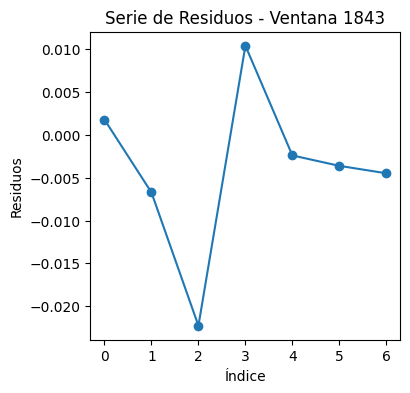

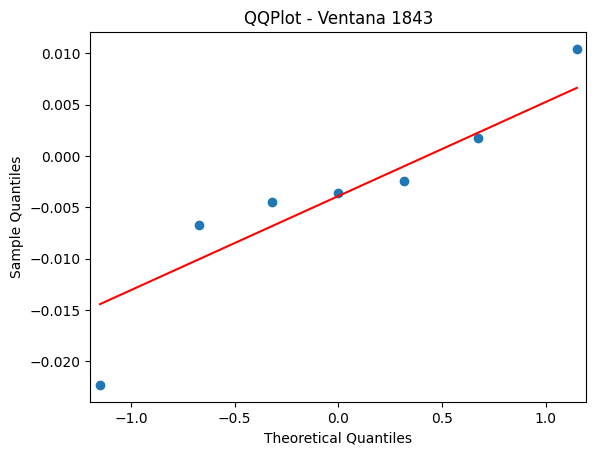

C:\Users\claud\AppData\Local\Temp\ipykernel_24768\3775612513.py:37: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.
  plt.stem(range(len(acf_vals)), acf_vals, use_line_collection=True)


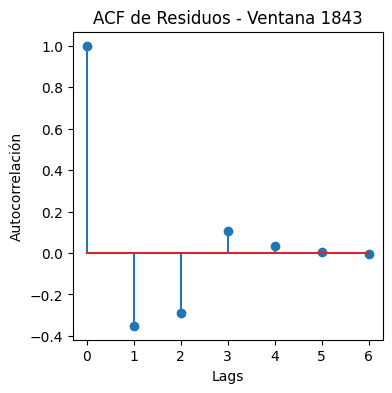

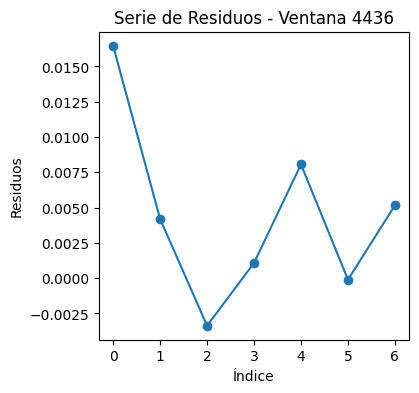

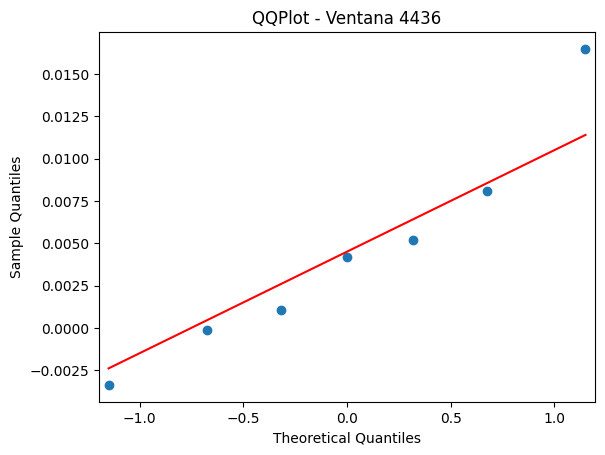

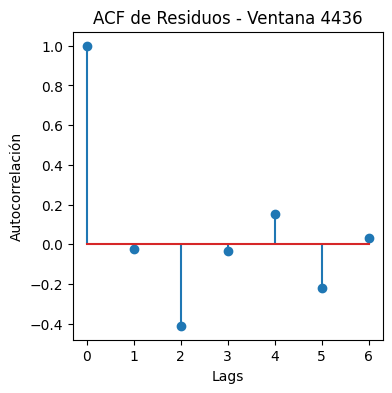

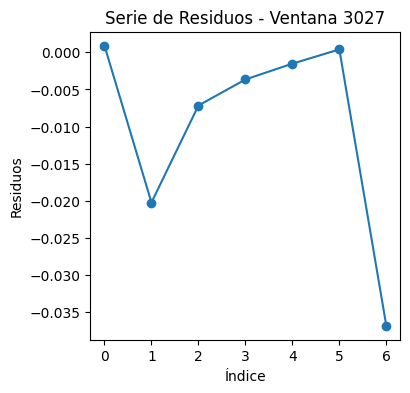

...

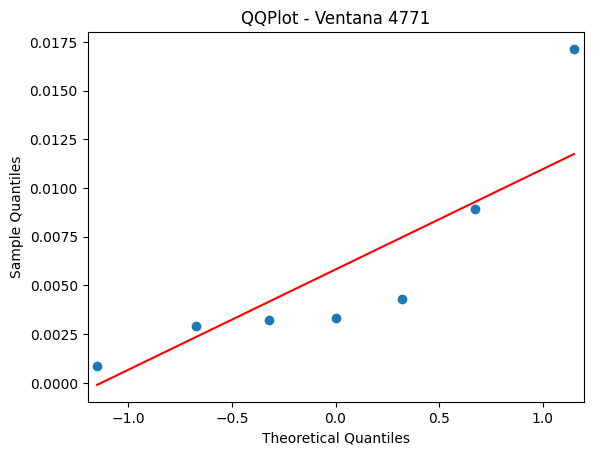

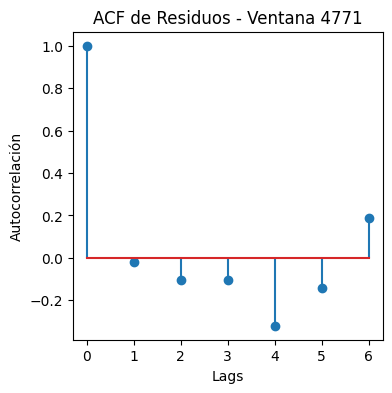

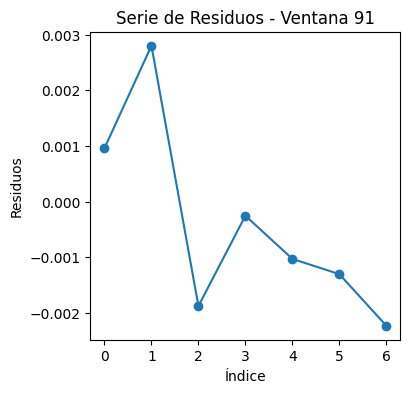

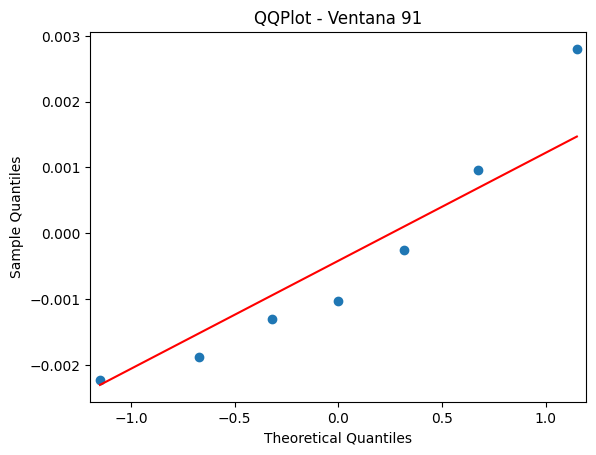

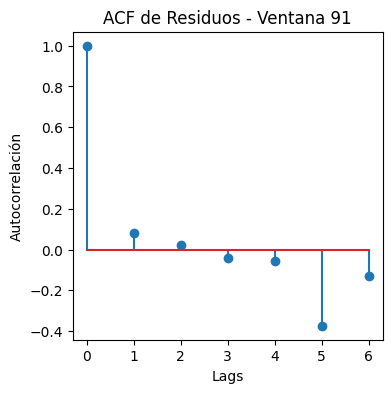

In [ ]:
res=residuals_bestmodel_ch


ljung_box_pvalues = []

for i, ventana in enumerate(res):
    ventana = np.array(ventana)
    ljung_box_pvalue = acorr_ljungbox(ventana, lags=[6], return_df=True)['lb_pvalue'].values[0]
    ljung_box_pvalues.append(ljung_box_pvalue)
df_resultados = pd.DataFrame({
    'Ventana': range(1, len(res) + 1),
    'LJung-Box (p-value)': ljung_box_pvalues
})

print(df_resultados.head(10))
# Seleccionar una muestra aleatoria de 5 ventanas para graficar
muestras = np.random.choice(len(res), size=5, replace=False)

for idx in muestras:
    ventana = np.array(res[idx])
    
    plt.figure(figsize=(4, 4))
    plt.plot(ventana, marker='o')
    plt.title(f'Serie de Residuos - Ventana {idx + 1}')
    plt.xlabel('Índice')
    plt.ylabel('Residuos')
    plt.show()

    
    qqplot(ventana, line='s')
    plt.title(f'QQPlot - Ventana {idx + 1}')
    plt.show()

    
    acf_vals = acf(ventana, nlags=min(10, len(ventana) - 1))
    plt.figure(figsize=(4, 4))
    plt.stem(range(len(acf_vals)), acf_vals, use_line_collection=True)
    plt.title(f'ACF de Residuos - Ventana {idx + 1}')
    plt.xlabel('Lags')
    plt.ylabel('Autocorrelación')
    plt.show()




Los residuales no cumplen con los supuestos al igual que en la serie price eso puede deberse al sobre ajuste del modelo

#### Tabla de todos los modelos, sus parametros y sus metricas

In [ ]:
metrics_list = validation_metrics_ch  
metricas = []

for i in metrics_list:
        
        metricas.append(i)
metricasval=pd.DataFrame(metricas)
metricasval = metricasval.drop_duplicates()
metricasval

,neurons,batchsize,Dropout,horizon,window,MAPE,MAE,MSE,RMSE,R2
0,10,16,0.2,7,7,15.617120,0.179193,0.059093,0.243091,-180.511995
1,10,32,0.2,7,7,37.880822,0.434304,0.260337,0.510233,-798.659770
2,10,64,0.2,7,7,96.673118,1.108118,1.585581,1.259199,-4869.996929
3,10,128,0.2,7,7,109.988278,1.260652,2.694763,1.641573,-8276.692689
4,10,16,0.4,7,7,28.624058,0.328263,0.117071,0.342156,-358.632929
...,...,...,...,...,...,...,...,...,...,...
251,10000,128,0.6,28,28,2.328856,0.026710,0.001174,0.034267,-2.551069
252,10000,16,0.8,28,28,7.396625,0.084988,0.007637,0.087389,-22.094984
253,10000,32,0.8,28,28,4.850389,0.055796,0.003561,0.059671,-9.767633
254,10000,64,0.8,28,28,1.837308,0.021211,0.000822,0.028669,-1.485493


In [ ]:
fig = px.line(metricasval, y='MSE', title='MSE vs Índice', labels={'index': 'Índice', 'MSE': 'MSE'})
fig.show()

De la grafica de MSE vs la iteración del modelo podemos ver que a medida que se aumentan las neuronas ( que fueron el búcle más grande) el modelo tiene mejores metricas pero esto también puede implicar sobre ajuste del modelo

#### Boxplot

In [ ]:
metrics_list = train_metrics_ch  
metricas_train = []

for i in metrics_list:
        
    metricas_train.append(i)
metricas_train=pd.DataFrame(metricas_train)
metricas_train = metricas_train.drop_duplicates()

metrics_list = test_metrics_ch

metricas_test = []

for i in metrics_list:
    
    metricas_test.append(i)
metricas_test=pd.DataFrame(metricas_test)
metricas_test = metricas_test.drop_duplicates()

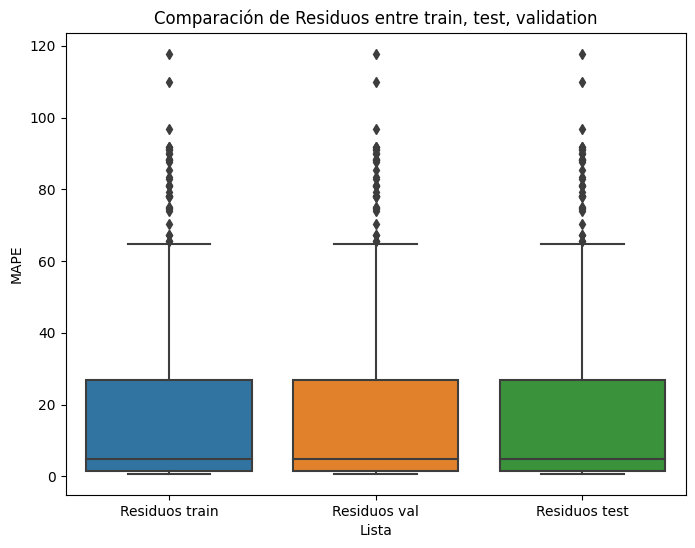

In [ ]:
errores_train =  metricas_train['MAPE']
errores_val=   metricasval['MAPE']
errores_test =  metricas_test['MAPE']

# Crear una lista que contenga todas las listas de residuos
residuos = [errores_train, errores_val, errores_test]

# Crear el Boxplot usando Seaborn
plt.figure(figsize=(8, 6))
sns.boxplot(data=residuos)

# Personalizar el gráfico
plt.title('Comparación de Residuos entre train, test, validation')
plt.xlabel('Lista')
plt.ylabel('MAPE')
plt.xticks(ticks=[0, 1, 2], labels=['Residuos train', 'Residuos val', 'Residuos test'])

# Mostrar el gráfico
plt.show()

La medianas se ven similares, incluso se logra ver que las casjas son iguales. Por lo que se puede afirmar que el modelo tuvo un comportamiento constante. como los puntos por fuera de las cajas son similares señala que los datos eran atípicos y no son un error del modelo.

### Prediciones

In [ ]:
mejormodelo=best_model_ch

X_train, Y_train, X_val, Y_val, X_test, Y_test=create_sliding_windows(datos, 7, 7)

train=mejormodelo.predict(X_train)
val=mejormodelo.predict(X_val)
test=mejormodelo.predict(X_test)

156/156 [==============================] - 1s 4ms/step


In [ ]:
train_data = []
for i, row in enumerate(train):
    for j, value in enumerate(row):
        train_data.append({
            "Conjunto": "Train", 
            "Índice": i + 1 + j, 
            "Valor": value
        })
        
val_data = []
for i, row in enumerate(val):
    for j, value in enumerate(row):
        train_data.append({
            "Conjunto": "val",  
            "Índice": i + 8+ j, 
            "Valor": value
        })
test_data = []
for i, row in enumerate(test):
    for j, value in enumerate(row):
        train_data.append({
            "Conjunto": "test",  
            "Índice": i + 16+ j, 
            "Valor": value
        })

# Preparar los datos para la lista 'datos'
datos_data = []
for i, value in enumerate(datos):
    datos_data.append({
        "Conjunto": "Datos", 
        "Fila": "Serie Datos", 
        "Índice": i+1,  
        "Valor": value
    })

# Combinar ambos conjuntos de datos en un DataFrame
df_plot = pd.DataFrame(train_data + datos_data+val_data+test_data)

# Crear el gráfico con Plotly Express
fig = px.line(
    df_plot, 
    x="Índice", 
    y="Valor", 
    color="Conjunto",  # Diferenciar 'Train' y 'Datos'
      # Mantener la separación por filas
    markers=True, 
    title="Gráfico de Train y Lista Datos"
)

# Mostrar la figura
fig.show()


Como se ve en la gráfica el modelo es capaz de identificar las tendencias y la serie en general a excepción de los picos abrutos.